In [3]:
import io
from nbformat import current

with io.open("Werkzeugverschleiss.ipynb", 'r', encoding='utf-8') as f:
   nb = current.read(f, 'json')

word_count = 0
for cell in nb.worksheets[0].cells:
   if cell.cell_type == "markdown":
       word_count += len(cell['source'].replace('#', '').lstrip().split(' '))
print(word_count)

3271


<span style="color:DarkBlue;font-size:18px">Semesterabschließende schriftliche Ausarbeitung im Modul Machine Learning (SS2022)</span>

<span style="color:DarkBlue;font-size:32px">Prognose des Werkzeugverschleiß bei einer Schleifbearbeitung mittels Machine Learning</span>

<span style="color:DarkBlue;font-size:18px"> Bearbeitet von Sebastian Zeleny</span>

# Inhaltsverzeichnis
**1. Einleitung**

    1.1 Was ist Schleifen?  
    1.2 Bandschleifmaschine  
    1.3 Ziel / Motivation  
**2. Vorbereitung** 

    2.1 Auslesen der InfluxDB
    
**3. Umsetzung**  

    3.1 Datenexploration  
   
        3.1.1 Ausgabe der deskriptiven statistischen Eigenschaften des Datensatzes  
        3.1.2 Ausgabe der Korrelationsmatrix  
		3.1.3 Histogramm der Daten  
		3.1.4 Lineare Regression 
        
	3.2 K-Nearest Neighbor
    
        3.2.1 Modellerstellung
		3.2.2 Evaluation des Modells  
		3.2.3 Vergleich der Fehlerrate mit der Wahl des K´s  
		3.2.4 Tuning der Hyperparameter  
        
	3.3 Mehrdimensionale lineare Regression
        
        3.3.1 Modellerstellung
		3.3.2 Evaluation des Modells
        
    3.4 Random Forest Regressor  
    
		3.4.1 Modellerstellung  
		3.4.2 Gittersuche zum Optimieren der Hyperparameter  
		3.4.3 Evaluation und Vergleich der Metriken  
        
	3.5 UI
 
**4. Zusammenfassung**  
    
    4.1 Ausblick  


# 1. Einleitung

Die Berger Gruppe ist eine mittelständige Unternehmensgruppe, welche Sonderlösungen für Schleif- und Polieranwendungen entwickelt.  
Zum Maschinen-Portfolio gehören Bandschleifmaschine (BSM) zur Feinstbearbeitung von Stahlbändern. Diese Bänder werden zu verschiedensten Produkten verarbeitet, wie z.B. Messer- (Cutter-Messer), chirurgische (Mikrotom) oder Rasierklingen.

### 1.1 Was ist Schleifen?

Das Schleifen ist ein spanendes Fertigungsverfahren, bei welchem die Schleifkörner, welche aus natürlichen oder synthetischen Schleifmitteln bestehen, zu Werkzeugen gebunden sind.  
Diese Schleifwerkzeuge trennen mit hoher Geschwindigkeit den Werkstoff vom Werkstück ab, indem das Werkzeug das Werkstück berührt.

---
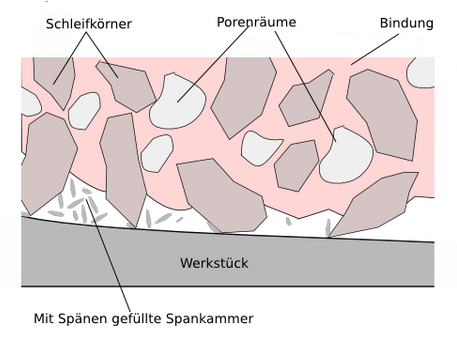
Quelle:  
*https://www.fachwissen-technik.de/images/schleifkoerper.png*

---


Allerdings erfolgt die Spanabnahme nicht nur am Werkstück, sondern auch am Werkzeug. 
>**Das Schleifwerkzeug verschleißt während des Prozesses.**

### 1.2 Bandschleifmaschine

Wie erwähnt sind Bandschleifmaschinen (BSM) zur Feinstbearbeitung von endlosen Stahlbändern entwickelt.  
Dabei wird das aufgewickelte Material von einer Haspel abgewickelt, geschliffen und anschließend wieder aufgewickelt.
Das Bandmaterial wird an einem rotierenden Schleifstein vorbeigezogen, wodurch Material abgetragen wird.  
Eine Facette wird angeschliffen.
Diese Facette wird mit einem Kamerasystem erfasst und die erzeugte Breite gemessen.

---
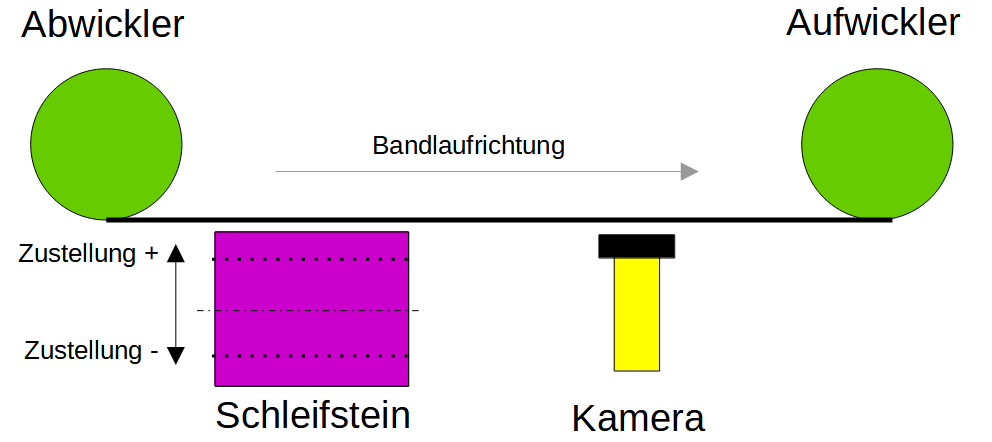
Abbildlung 1: Prinzip Bandschleifmaschine 

---
Das Schleifwerkzeug unterliegt einem Verschleiß, d.h. der Durchmesser nimmt während der Bearbeitung ab.  
Um eine gleichbleibende Zielgröße der geschliffenen Fläche zu erreichen, muss der Verschleiß des Werkzeugs kompensiert werden.  
Aktuell wird ein Kamerasystem verwendet, um die Differenz zwischen Ist- und Sollgröße des Merkmals zu erfassen. Die Differenz wird als Zustellgröße für das Werkzeug verwendet, um den Verschleiß zu kompensieren.
Aufgrund des mechanischen Aufbaus liegen zwischen Werkzeug und Kamera ca. 2m Bandmaterial.  
D.h. ein Verschleiß des Werkzeugs wird erst nach 2m Totzeit erfasst und zugestellt.

### 1.3 Ziel / Motivation

Die vorliegende Dokumentation soll als Proof-of-Concept (PoC) dienen, ob Methoden des Machine-Learnings zur Lösung eines prozesstechnischen Problems genutzt werden können.

Mittels Machine Learning sollen Merkmale gefunden werden, die den Steinverschleiß beschreiben (Steinverschleiß pro Meter Material) und vorhersagen können.  
Das Ziel ist den Verschleiß mit einem Modell, anhand aktueller Prozessdaten, vorherzusagen, um diese Größe während des Schleifprozesses zustellen und kompensieren zu können.  

# 2. Vorbereitung
Da es keine Datenbasis für das Verschleißverhalten und Prozessparameter gibt, müssen in einem ersten Schritt Daten definiert und gesammelt werden.  
Das zu prognostizierende Label ist der Steinverschleiß (grün) und mögliche Prozessdaten, welche das Verschleißverhalten charakterisieren (gelb):

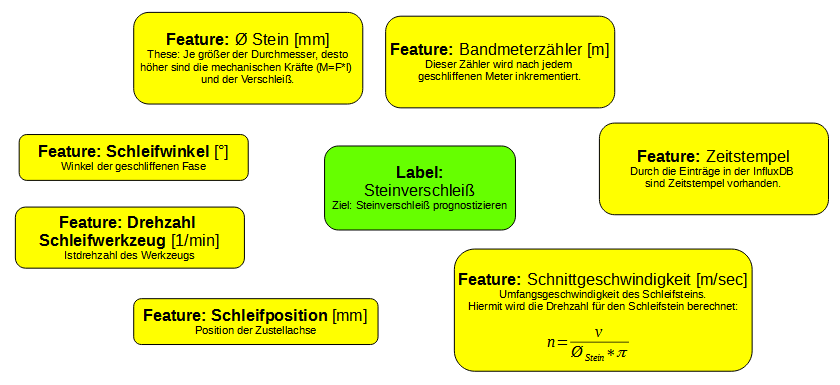
Abbildung: Featureauswahl


Nach der Definition der Parameter wurde bei zwei Produktionsmaschinen ein Datensammler installiert.  
Die Prozessdaten werden aus der Siemens CNC-Steuerung ausgelesen und in einer InfluxDB persistiert.  
Hierbei wurden Maschinen gewählt, welche unterschiedliche Bearbeitungen durchführen, also eine Varianz in den Prozessparametern besitzen.


## 2.1 Auslesen der InfluxDB
Die Datensätze der Maschinen wurden mittels separaten Python-Skript ausgelesen und als Rohdaten-csv gespeichert.  
Influx ist eine Zeitreihendatenbank, d.h. der Zeitstempel taucht in jedem Datensatz auf. 
Da ein Datensatz aus verschiedenen Merkmalen besteht, diese aber nicht immer aktualisierte Werte beinhalten, entstehen viele NaN-Werte.  
Für eine sinnvolle Verwendung der Daten müssen folgende Schritte durchgeführt werden:
- Auffüllen der Null-Werte
- Berechnen des Steinverschleiß in einer separaten Spalte
- Erstellen einer neuen Spalte mit der bearbeiteten Meterzahl
- Erstellen einer Spalte "zerspantes Volumen"  
- Entfernen von Ausreißern
- Entfernen von Duplikaten
- Plausibilitätsprüfung

Im folgenden wird die Aufbereitung der Rohdaten erläutert.  

**Schritt 1: Einlesen der Rohdaten-CSV Datei und Aufbereitung der Daten:** 

```python
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt
import scipy
from sklearn.linear_model import LinearRegression

#Einlesen der Rohdaten
df1=pd.read_csv("Datasets/rawData/01_5976VS2_RAW.csv")

#Auffüllen der Null-Werte
df1=df1.fillna(method='ffill')
df1=df1.fillna(method='bfill')

#Erstellung einer neuen Spalte 'WheelWear': Differenz zw. aufeinanderfolgenden Steindurchmessern
df1['WheelWear']=df1['WheelDia'].diff()

#Erstellung einer neuen Spalte 'Sum', in welcher die Meterzahl des Datensatzes berechnet wird
df1['Sum']=df1['Tapemeter']-df1['Tapemeter'].iloc[0]

#Ausreißer entfernen aus Steinverschleiß, da beim Starten/Stoppen ein Sicherheitsabstand gefahren wird
#Nullwerte entfernen

#Erstellen von Indexliste, um Einträge unter- bzw. oberhalb eines Schwellwerts zu entfernen 
dropListNeg1=df1[df1['WheelWear']<=-0.1].index
dropListPos1=df1[df1['WheelWear']>0.1].index
dropListZero1=df1[df1['WheelWear']==0].index

#Lösche die Daten anhand der Indexliste
df1.drop(dropListNeg1, inplace=True)
df1.drop(dropListPos1, inplace=True)
df1.drop(dropListZero1, inplace=True)
```

**Schritt 2: Hinzufügen von Informationen / Erzeugen von Geometriedaten / zerspantes Volumen**

```Python
#Hinzufügen von Geometrie / zerspantes Volumen
Thickness=df1['TapeThickness']
GrindAngle=df1['Grindangle']

df1['CutFace']=(Thickness/2)/np.tan(np.radians(GrindAngle))
df1.head()
```

**Schritt 3: Aufräumen des Datensatzes** 

```Python
#Lösche Spalten 'time', 'Tapemeter', 'Sum', 'TapeThickness'
dfClean=df1.copy()
dfClean.drop('time', axis=1, inplace=True)
dfClean.drop('Tapemeter', axis=1, inplace=True)
dfClean.drop('Sum', axis=1, inplace=True)
dfClean.drop('TapeThickness', axis=1, inplace=True)

#Lösche NaN Zeilen
dfClean.dropna(inplace=True)

#Lösche Dubletten
dfClean.drop_duplicates(inplace=True)

#Re-Indexierung
dfClean=dfClean.reset_index(drop=True)

#Lösche NaN Zeilen
dfClean.dropna(inplace=True)

#Lösche Dubletten
dfClean.drop_duplicates(inplace=True)
```

# 3. Umsetzung
## 3.1  Datenexploration

Nach Aufbereitung und Bereinigung der Daten werden die gespeicherten Datensätze, welche nun eine homogene Struktur aufweisen, eingelesen.  
Die vorhandenen Daten werden zu einem Dataframe Objekt zusammengefasst. 

In [1]:
#Import der benötigten Module
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt
import scipy
from sklearn.linear_model import LinearRegression

In [2]:
#Einlesen der csv-Dateien in einzelne Dataframes
df1=pd.read_csv('Datasets/01_5976VS2.csv')
df2=pd.read_csv('Datasets/02_5713VS3.csv')
df3=pd.read_csv('Datasets/03_5976VS2_2.csv')
df4=pd.read_csv('Datasets/04_5976VS1.csv')
df5=pd.read_csv('Datasets/05_5976VS1_2.csv')
df6=pd.read_csv('Datasets/06_5976FS3.csv')
df7=pd.read_csv('Datasets/07_5976FS4.csv')

In [3]:
#Konkatination der Dataframes zu einem einzelnen Objekt
#Löschen von überflüssigen Spalten
frames=[df1,df2,df3,df4,df5,df6,df7]
df = pd.concat(frames)
df.drop('Unnamed: 0', axis=1, inplace=True)
df.drop('TapeThickness', axis=1, inplace=True)
df.drop('Grindangle', axis=1, inplace=True)

### 3.1.1 Ausgabe der deskriptiven statistischen Eigenschaften des Datensatzes
Um einen ersten Eindruck über die Größe des Datensatzes und Verteilung der Werte zu erhalten, bietet sich die *describe*-Methode an.  
Der Dataframe besteht aus fast 57000 Datensätzen. 

In [4]:
df.describe()

,WheelDia,TapeSpeed,WheelWear,CutFace
count,56850.000000,56850.000000,56850.000000,56850.000000
mean,246.829604,1.800164,-0.010288,2.179960
std,31.131075,0.635598,0.012519,0.731706
min,180.324005,1.200000,-0.099991,1.485696
25%,219.777000,1.600000,-0.019989,1.510281
50%,242.907005,1.600000,-0.007996,1.510281
75%,274.885490,1.600000,-0.002014,2.974219
max,299.347961,5.000000,0.062012,2.974219


### 3.1.2 Ausgabe der Korrelationsmatrix
Unter Korrelation versteht man den Zusammenhang zwischen zwei Variablen. Wenn hohe Werte der einen mit hohen Werten der anderen Variable korrelieren, liegt eine positive Korrelation vor.
Wenn hohe Werte der einen Variable mit niedrigen Werten der anderen Variable korrelieren, liegt eine negative Korrelation vor.
Der Korrelationskoeffizient ist standardisiert, d.h. dieser beschreibt die Korrelation in einem Wertebereich von -1..+1.  
Die Hauptdiagonale der Matrix ist 1, da die Elemente mit sich selber korrelieren. 

Die explorative Datenanalyse dient dazu, Zusammenhänge zwischen den Variablen zu finden und diese im Weiteren zu nutzen.
Wünschenswert sind hohe positive bzw. hohe negative Korrelationskoeffizienten. 
Ist der Korrelationskoeffizient 0 liegt kein Zusammenhang vor.

Die Ausgabevariable des zu erstellenden Modells ist *WheelWear*. 
Erstaunlicherweise liegt nur eine Korrelation zwischen dem Verschleiß (*WheelWear*) und dem Zerspanvolumen (*CutFace*) vor. 

**Desweiteren kann die Methode zur Korrelationsbestimmung festgelegt werden:**    
1. Pearson: Die ist die Standardmethode zur Bestimmung der Korrelation und wird bei metrischskalierten (z.B. Preis in Euro, Länge in m), stetigen Variablen verwendet.
2. Spearman: Zu Verwenden bei ordinalskalierten (wie z.B. Schulnoten, Rangordnung, keine interpretierbaren Abstände) und diskreten Werten.
3. Kendall: Zu Verwenden bei oridnalskalierten und stetigen Werten.

Quellen:  
https://wissenschafts-thurm.de/grundlagen-der-statistik-wie-unterscheidet-man-zwischen-nominal-ordinal-und-kardinalskala/  
https://wissenschafts-thurm.de/grundlagen-der-statistik-zusammenhangsmasse-die-korrelationskoeffizienten-nach-spearman-und-kendall/

In [5]:
#df.corr(method='spearman')
#df.corr(method='kendall')
df.corr(method='pearson')

,WheelDia,TapeSpeed,WheelWear,CutFace
WheelDia,1.000000,-0.017939,0.092053,-0.025939
TapeSpeed,-0.017939,1.000000,-0.061441,-0.317897
WheelWear,0.092053,-0.061441,1.000000,-0.468314
CutFace,-0.025939,-0.317897,-0.468314,1.000000


### 3.1.3 Histogramm der Daten
Das Histogramm ist die visuelle Darstellung der Häufigkeitsverteilung der Variablen.  
Die grafische Darstellung der Daten ist eines der wichtigsten Werkzeuge in der Datenanalyse, um durch die Visualisierung Informationen und Zusammenhänge zu erkennen. 

Durch die visuelle Darstellung ist zu erkennen, dass überwiegend mit einer Bandgeschwindigekeit (*TapeSpeed*) von 1,6 m/min geschliffen wurde und der Datensatz nur zwei verschiedene Geometrien bzw. Verschleißvolumina aufweist (*CutFace*). 

array([[<AxesSubplot:title={'center':'WheelDia'}>,
        <AxesSubplot:title={'center':'TapeSpeed'}>],
       [<AxesSubplot:title={'center':'WheelWear'}>,
        <AxesSubplot:title={'center':'CutFace'}>]], dtype=object)

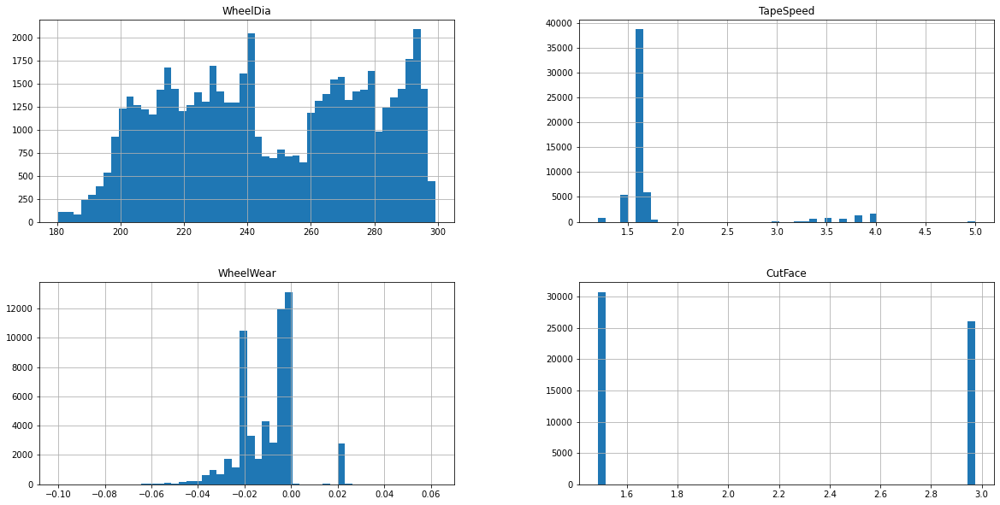

In [6]:
#Visualisiere die Verteilung der Werte
df.hist(bins=50, figsize=(20,10))

### 3.1.4 Lineare Regression
Der Korrelationskoeffzient zwischen Werkzeugdurchmesser und Verschleiß lag bei 0,09 somit nahe 0.  
Dies bedeutet, dass die Variablen kaum voneinander abhängig sind.  

Aufgrund des Prozesswissens ist bekannt, dass bei abnehmendem Werkzeugdurchmesser jedes Schleifkorn mehr arbeiten muss und der Verschleiß steigt. Die Schleifscheibe wird aggressiver, da weniger Schleifkörner die gleiche Arbeit zu verrichten haben und der Eingriffswinkel in das Werkstück steiler wird.  
Um diese These zu verifizieren, wird die lineare Regression verwendet.  
Für jeden Dataframe und für alle Dataframes als Gesamtheit wird ein lineares Modell erstellt und visualisiert. 

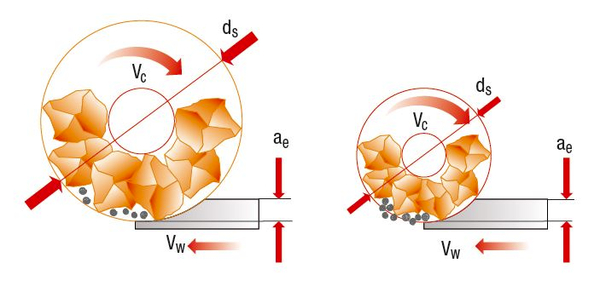

Quelle:  
https://www.schleifprofi.com/schleifverfahren/rundschleifen/rundschleifen-gut-zu-wissen/

In [7]:
#Einzeldatensätze
X1 = np.array(df1["WheelDia"]).reshape(-1,1)
y1 = np.array(df1["WheelWear"]).reshape(-1,1)

X2 = np.array(df2["WheelDia"]).reshape(-1,1)
y2 = np.array(df2["WheelWear"]).reshape(-1,1)

X3 = np.array(df3["WheelDia"]).reshape(-1,1)
y3 = np.array(df3["WheelWear"]).reshape(-1,1)

X4 = np.array(df4["WheelDia"]).reshape(-1,1)
y4 = np.array(df4["WheelWear"]).reshape(-1,1)

X5 = np.array(df5["WheelDia"]).reshape(-1,1)
y5 = np.array(df5["WheelWear"]).reshape(-1,1)

X6 = np.array(df6["WheelDia"]).reshape(-1,1)
y6 = np.array(df6["WheelWear"]).reshape(-1,1)

X7 = np.array(df7["WheelDia"]).reshape(-1,1)
y7 = np.array(df7["WheelWear"]).reshape(-1,1)

#kompletter Datensatz
X = np.array(df["WheelDia"]).reshape(-1,1)
y = np.array(df["WheelWear"]).reshape(-1,1)

#Erstelle den linearen Regressor
regressor1 = LinearRegression()
regressor1.fit(X1, y1)

regressor2 = LinearRegression()
regressor2.fit(X2, y2)

regressor3 = LinearRegression()
regressor3.fit(X3, y3)

regressor4 = LinearRegression()
regressor4.fit(X4, y4)

regressor5 = LinearRegression()
regressor5.fit(X5, y5)

regressor6 = LinearRegression()
regressor6.fit(X6, y6)

regressor7 = LinearRegression()
regressor7.fit(X7, y7)

#Gesamtregressor
regressor = LinearRegression()
regressor.fit(X, y)
#---------------------------------------------------------
#Einstellungen für Subplot
figure, axis = plt.subplots(4, 2,figsize=(20, 14), dpi=600)
figure.tight_layout()

axis[0, 0].scatter(X1, y1,alpha=0.3, color = 'purple')
axis[0, 0].plot(X1, regressor.predict(X1), color = 'green', label="Regressor")
axis[0, 0].set_title("Dataset 1")

axis[0, 1].scatter(X2, y2,alpha=0.3, color = 'yellow')
axis[0, 1].plot(X2, regressor.predict(X2), color = 'green', label="Regressor")
axis[0, 1].set_title("Dataset 2")

axis[1, 0].scatter(X3, y3,alpha=0.3, color = 'red')
axis[1, 0].plot(X3, regressor.predict(X3), color = 'green', label="Regressor")
axis[1, 0].set_title("Dataset 3")

axis[1, 1].scatter(X4, y4,alpha=0.3, color = 'cyan')
axis[1, 1].plot(X4, regressor.predict(X4), color = 'green', label="Regressor")
axis[1, 1].set_title("Dataset 4")

axis[2, 0].scatter(X5, y5,alpha=0.3, color = 'blue')
axis[2, 0].plot(X5, regressor.predict(X5), color = 'green', label="Regressor")
axis[2, 0].set_title("Dataset 5")

axis[2, 1].scatter(X6, y6,alpha=0.3, color = 'magenta')
axis[2, 1].plot(X6, regressor.predict(X6), color = 'green', label="Regressor")
axis[2, 1].set_title("Dataset 6")

axis[3, 0].scatter(X7, y7,alpha=0.3, color = '#EDB120')
axis[3, 0].plot(X7, regressor.predict(X7), color = 'green', label="Regressor")
axis[3, 0].set_title("Dataset 7")

axis[3, 1].scatter(X, y,alpha=0.3, color = '#4DBEEE')
axis[3, 1].plot(X, regressor.predict(X), color = 'green', label="Regressor")
axis[3, 1].set_title("Dataset total")
plt.legend(loc="lower right")
plt.show()

Die Plots bestätigen die These, dass der Werkzeugverschleiß linear vom Durchmesser abhängt.  
Je kleiner der Durchmesser, desto höher der Verschleiß, da jede Schneide (Korn) stärker belastet wird.  

**Gesamtplot lineare Regression:**  
Folgend wird ein Gesamtplot aller linearen Regressoren ausgegeben, um visuell den Zusammenhang zu prüfen.  

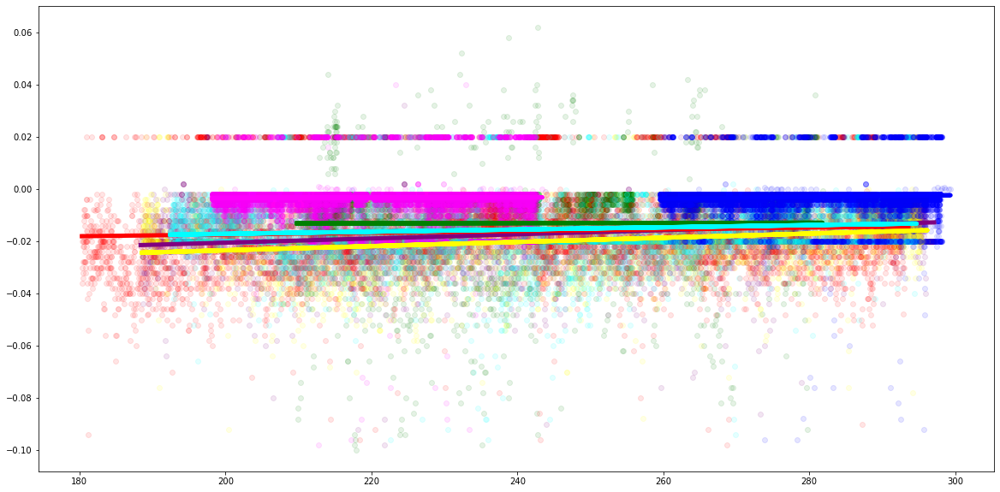

In [8]:
#Alle Datensätze übereinander und alpha=0.1, um die Dichte an Datenpunkten zu erkennen
plt.subplots(figsize=(20,10))

plt.scatter(X1, y1, color = 'purple',alpha=0.1)
plt.scatter(X2, y2, color = 'green',alpha=0.1)
plt.scatter(X3, y3, color = 'yellow',alpha=0.1)
plt.scatter(X4, y4, color = 'red',alpha=0.1)
plt.scatter(X5, y5, color = 'cyan',alpha=0.1)
plt.scatter(X6, y6, color = 'blue',alpha=0.1)
plt.scatter(X7, y7, color = 'magenta',alpha=0.1)

plt.plot(X1, regressor1.predict(X1), color = 'purple', linewidth=5)
plt.plot(X2, regressor2.predict(X2), color = 'green', linewidth=5)
plt.plot(X3, regressor3.predict(X3), color = 'yellow',linewidth=5)
plt.plot(X4, regressor4.predict(X4), color = 'red',linewidth=5)
plt.plot(X5, regressor5.predict(X5), color = 'cyan',linewidth=5)
plt.plot(X6, regressor6.predict(X6), color = 'blue',linewidth=5)
plt.plot(X7, regressor7.predict(X7), color = 'magenta',linewidth=5)

Das Gesamtdiagramm bestätigt ebenfalls die Annahme, dass der Verschleiß abhängig vom Durchmesser ist. 
Die Steigungen der Geraden unterscheiden sich aufgrund unterschiedlicher Prozessparameter, wie z.B. Schleifwinkel, Bandgeschwindigkeit usw.

**Warum gibt es positiven Verschleiß?**  
In den abgebildeten Plots ist positiver Verschleiß zu erkennen, welcher im ersten Moment unplausibel erscheint, da dass Werkzeug verschleißt und der Durchmesser stetig kleiner werden sollte.    
1. **Längenausdehnung Maschinenteile:** Die Maschinenkomponenten bestehen aus Stahl, welcher sich durch Erwärmung ausdehnt.  Durch den Antriebsmotor und Kühlmittel an der Schleifvorrichtung ergeben sich unterschiedliche Temperaturen und Ausdehnungen. Der Werkzeugschlitten hat ca. eine Länge von 400mm. Hieraus ergibt sich bei einen Ausdehnungkoeffizient von 13.6 * 10-6/K bei 20° C:

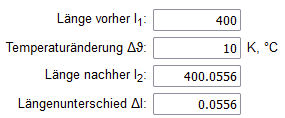

2. **Werkzeug wächst:** Das Werkzeug besteht aus porösen Material, d.h. es ist aufgebaut wie ein Schwamm.   Wird Kühlwasser auf das Werkzeug gegeben, "wächst" der Durchmesser.  

Quelle:  
https://rechneronline.de/material/waermeausdehnung.php
 

## 3.2 K-Nearest Neighbor

Mit den vorhandenen Daten wird ein k-nächster Nachbar Klassifikator erstellt.  
>**Ziel:** Erstellung eines Klassifikators, der ein Wertetupel von Prozessdaten in hohen, mittleren, niedrigen oder unplausiblen Verschleiß kategoriert.

Beim KNN Algorithmus wird eine Beobachtung klassifiziert, indem eine gewisse Anzahl von bekannten Nachbardaten mit dem neuen Datenpunkt verglichen wird. Je ähnlicher die Punkte und je gleicher die Merkmale, desto eher wird dieser Punkt in eine Kategorie einsortiert.  
Das wichtigste Merkmal ist hierbei das Distanzmaß zwischen bestehenden und neuem Datenpunkt, welche die Ähnlichkeit bzw. Nähe zueinander beschreibt.
Die wichtigsten Distanzmaße sind:
- euklidische Distanz
- Manhattan Distanz

Achtung: Bei einem Klassifikator darf die vorherzusagende Variable nicht koninuierlich sein (Float).
D.h. der Steinverschleiß muss kategorisiert werden. Dafür wird der Steinverschleiß (*WheelWear*) in Intervalle aufgeteilt.   
Die Intervalle wurden auf Basis der Histogramme erstellt:
- low = 0..-0.0075mm
- med = -0.0075..-0.06mm
- high = -0.06..-0.2mm

>Wie in Kap. 3.1.4 erklärt, gibt es in den Datensätzen positiven Verschleiß. Durch diese vermeintlichen Ausreißer wird das Modell schlechter.  
Das Modell soll den negativen Verschleiß prognostizieren und nicht durch weitere Einflüße, wie z.B. einen Temperaturdrift gestört werden.
Deshalb wird positiver Verschleiß aus dem Datensatz entfernt.  
Die Modelle wurden vorab mit dem vollständigen Datensatz angelernt. Das Entfernen des positiven Verschleiß wurde nach der Modellevaluation durchgeführt.

Quelle:  
https://www.kaggle.com/code/prashant111/knn-classifier-tutorial/notebook

### 3.2.1 Modellerstellung

In [9]:
# KNN aus der scikit-learn-Bibliothek importieren
from sklearn.neighbors import KNeighborsClassifier

#Importiere Train_Test_Split
from sklearn.model_selection import train_test_split

#Importiere den Standard Scaler
from sklearn.preprocessing import StandardScaler

In [10]:
#Erstelle eine Kopie des ursprunglichen Datensatzes 
dfKNN=df.copy()

#Erstelle neuen Dataframe ohne positiven Steinverschleiß 
dfKNN=dfKNN[dfKNN.WheelWear<=0]

#WheelWear wird bei Vorhersage ausgeschlossen
X = dfKNN.drop(['WheelWear'], axis=1)

In [11]:
#Grenzen für die Kategorieintervalle
bins = [-0.2, -0.06, -0.0075, 0.00]

#Label für die erzeugten Kategorien
labels=['high','mid','low']

#Verwende Cut-Methode zum Kategorisieren
dfKNN['Cat'] = pd.cut(dfKNN["WheelWear"], bins=bins, labels=labels)

#setze Featurelabel auf Kategorie
y=dfKNN['Cat']

In [12]:
#Erstellen des Objekts knn mit einem K von 20
knn = KNeighborsClassifier(n_neighbors=20)

In [13]:
#Erstelle Trainings- und Testdaten
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [14]:
#Überprüfe Datensatz X_test auf fehlende Werte
X_test.isnull().sum()

WheelDia     0
TapeSpeed    0
CutFace      0
dtype: int64

In [15]:
#Skaliere die Daten
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [16]:
#Training des Modells mit den Trainigsdaten
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=20)

In [17]:
#Vorhersage mit den Testdaten
y_pred = knn.predict(X_test)

### 3.2.2 Evaluation des Modells

Um die Qualität des Vorhersagemodells zu beurteilen, wurde der Datensatz in Test- und Trainingsdaten aufgeteilt.  
Die zurückgehaltenen Testdaten werden nun verwendet, um das Modell auszuprobieren und die Genauigkeit zu beurteilen.  
Die Verteilung der Klassen sollte an dieser Stelle auch kurz betrachtet werden. Dafür wird der Datensatz nach der Kategorie gruppiert und anschließend die Größe bestimmt.  
Bei der vorliegenden Aufteilung sind die Klassen *mid* und *low* dominierend. Das Vorkommen der Klassen *impossible* und *high* ist so gering, dass diese niemals oder äußerst selten gewählt werden.
>Innerhalb einer Klassen sollten die Merkmale gleichverteilt und die Teilmengen (Klassen) sollten gleich groß sein! 

Die Genauigkeit ist definiert als der Quotient aus der Anzahl richtiger Vorhersagen zur Gesamtanzahl von Vorhersagen:

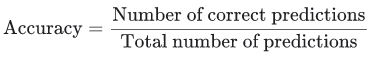

Wie unten zu sehen, liegt die Genauigkeit des Modells bei 80%, d.h. mit einer Wahrscheinlichkeit von 80% ist das Ergebnis des Modells richtig.  

Hier muss je nach Anwendungsfall entschieden werden, ob die Accuracy, Precision, Recall oder F1-Score die passende Metrik ist.

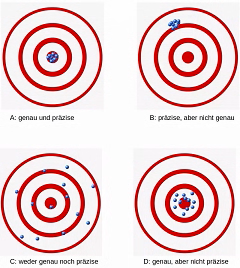

Quelle:  
https://developers.google.com/machine-learning/crash-course/classification/accuracy  
https://www.python-kurs.eu/metriken.php

In [18]:
#Verteilung der Klassen
dfKNN.groupby(['Cat']).size()

Cat
high      149
mid     28696
low     25009
dtype: int64

In [19]:
from sklearn.metrics import accuracy_score
print('Modellgenauigkeit 4 Kategorien: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Modellgenauigkeit 4 Kategorien: 0.8569


In [20]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred,zero_division=0))

              precision    recall  f1-score   support

        high       0.00      0.00      0.00        41
         low       0.84      0.86      0.85      8212
         mid       0.87      0.86      0.87      9519

    accuracy                           0.86     17772
   macro avg       0.57      0.57      0.57     17772
weighted avg       0.86      0.86      0.86     17772



**Reduktion auf 2 Kategorien**  
Folgend wird der Datensatz auf 2 Kategorien (high, low) reduziert, um zu überprüfen, ob die Verteilung einen Einfluß auf die Accuracy hat.  
Mit den neuen Intervallen sind die Daten gleichverteilt, die Accuracy erhöht sich leicht auf ~84%.

In [21]:
dfKNN2=dfKNN.copy()
#Grenzen für die Kategorieintervalle
bins2 = [-0.2, -0.0075, 1.00]

#Label für die erzeugten Kategorien
labels2=['high','low']

#Verwende Cut-Methode zum Kategorisieren
dfKNN2['Cat'] = pd.cut(dfKNN2["WheelWear"], bins=bins2, labels=labels2)

#setze Featurelabel auf Kategorie
y2=dfKNN2['Cat']

#Verteilung der Klassen
print("Anzahl Daten pro Kategorie: ",dfKNN2.groupby(['Cat']).size())

#Erstellen des Objekts knn mit einem K von 20
knn2 = KNeighborsClassifier(n_neighbors=20)
#Erstelle Trainings- und Testdaten
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y2, test_size=0.33, random_state=42)
#Skaliere die Daten
scaler = StandardScaler()
X_train2 = scaler.fit_transform(X_train2)
X_test2 = scaler.transform(X_test2)
#Training des Modells mit den Trainigsdaten
knn2.fit(X_train2, y_train2)
#Vorhersage mit den Testdaten
y_pred2 = knn2.predict(X_test2)

print('Modellgenauigkeit 2 Kategorien: {0:0.4f}'. format(accuracy_score(y_test2, y_pred2)))

Anzahl Daten pro Kategorie:  Cat
high    28845
low     25009
dtype: int64
Modellgenauigkeit 2 Kategorien: 0.8593


### 3.2.3 Vergleich der Fehlerrate mit der Wahl des K´s
Beim oberen Beispiel wurde zufällig ein K von 20 gewählt.  
Für die geeignete Anzahl von Nachbarn gibt es keine Vorschrift, sondern muss ermittelt werden. 
Um ein geeignetes K zu wählen, bietet es sich an, die Fehlerraten verschiedener K´s zu vergleichen.  
Beim folgendem Code wird der KNN mit verschiedener Anzahl von Nachbarn trainiert und der mittlere Fehler in einer Liste gespeichert.  

Anschließend wird der Index mit dem kleinsten Fehler (optimales K) selektiert. 

https://stackabuse.com/k-nearest-neighbors-algorithm-in-python-and-scikit-learn/

In [22]:
#Berechne den Fehler für verschiedene K´s 
#!!!ACHTUNG: lange Laufzeit!!!
error = []

# Calculating error for K values between 1 and 40
for i in range(1, 50):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred_i = knn.predict(X_test)
    error.append(np.mean(pred_i != y_test))

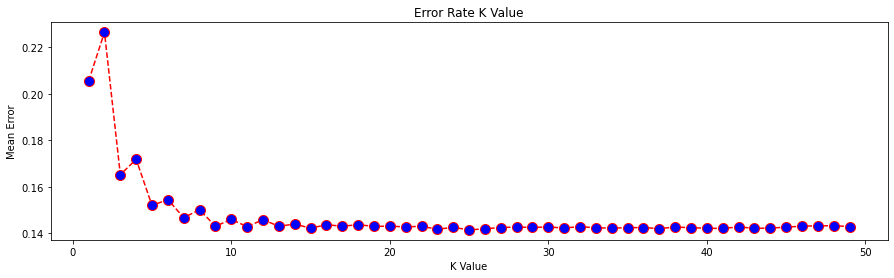

In [23]:
#Plotten der Fehlerrate
plt.figure(figsize=(15, 4))
plt.plot(range(1, 50), error, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')
plt.show()

In [24]:
#Index mit dem kleinsten Fehler finden; +1 um das K korrekt festzulegen
index_min = np.argmin(error)
print(f"Optimales K: {index_min+1} \nFehlerrate: {error[index_min+1]}")

Optimales K: 25 
Fehlerrate: 0.14202115687598468


### 3.2.4 Tuning der Hyperparameter
Mit einer Rastersuche/GridSearch werden alles Kombinationen von Hyperparametern in festgelegten Intervallen berechnet.  
Der KNN besitzt die Hyperparameter *leaf_size* und *n_neighbors*, welche mit folgendem Code überprüft werden.

>Achtung! Die Optimierung in folgender Codezeile dauert sehr lange. Deshalb wurde der Code auskommentiert und die Ergebnisse in die Zelle kodiert!

https://medium.datadriveninvestor.com/increase-10-accuracy-with-re-scaling-features-in-k-nearest-neighbors-python-code-677d28032a45

```python
from sklearn.model_selection import GridSearchCV

#List Hyperparameters to tune
leaf_size = list(range(1,5))
n_neighbors = list(range(20,40)) 
p=[1,2]#convert to dictionary
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)#Making model
clf = GridSearchCV(knn, hyperparameters, cv=10)
best_model = clf.fit(X_train,y_train)#Best Hyperparameters Value

print('Best leaf_size:', best_model.best_estimator_.get_params()['leaf_size'])
print('Best p:', best_model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', best_model.best_estimator_.get_params()['n_neighbors'])
```
**Ergebnis der Optimierung:**  
k=30  
leaf_size=2  
p=2


In [25]:
#Erzeugen des KNN mit optimierten Hyperparametern
knn = KNeighborsClassifier(n_neighbors=30,leaf_size=2,p=2)
#Training des Modells mit den Trainigsdaten
knn.fit(X_train, y_train)

#Erzeugen der Vorhersage
y_pred = knn.predict(X_test)

print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score: 0.8575


**Fazit:**  
Die Optimierung der Hyperparameter über die Gittersuche hat die Accuracy nicht verbessert!  

Vorher: 0.8593  
Nachher: 0.8575

## 3.3 Mehrdimensionale lineare Regression
Eine zweite ML-Anwendung ist ein multivariater Regressor, welcher alle abhängigen Variablen berücksichtigt.  
Der Datensatz umfasst eine große Menge an Prozessdaten und die Variablen korrelieren moderat miteinander.  

Ziel ist es mit Hilfe der vorhandenen Datensätze einen Regressor zu erzeugen und durch eine UI anwenderspezifische Prozessdaten einzugeben. Durch die Eingabe der Prozessdaten wird ein Werkzeugverschleiß prognostiziert.  
Die UI soll ein Prototyp sein, für eine Anwendung, welche die aktuellen Prozessdaten automatisiert dem Modell zuführt, um den zu erwartenden Verschleiß vorherzusagen.

Auch bei diesem Regressor wurden nach der Evaluation der positive Steinverschleiß entfernt (siehe Kap. 3.1.4). 

In [26]:
#Erstelle Kopie des Urspungsdatensatzes
dfLR=df.copy()
#Erstelle neuen Dataframe ohne positiven Steinverschleiß 
dfLR=dfLR[dfLR.WheelWear<=0]

In [27]:
#mehrdimensionale lineare Regression
#Zielvariable
yLR=dfLR['WheelWear']

#Features zum Vorhersagen mit Ausname der Zielvariablen
XLR=dfLR.drop('WheelWear', axis=1)

# splitting the data
x_train, x_test, y_train, y_test = train_test_split(XLR, yLR, test_size = 0.3, random_state = 42)

# creating an object of LinearRegression class
LR = LinearRegression(normalize=True)
# fitting the training data
LR.fit(x_train,y_train)
y_prediction =  LR.predict(x_test)

### 3.3.1 Evaluation des Modells
Die Vorhersagequalität eines Regressors muss beurteilt werden, um ein Maß für die Güte zu erhalten.  
Es ist ratsam verschiedene Metriken anzuwenden und zu vergleichen. 

Die **mittlere absolute Abweichnung (Mean-Absolute-Error - MAE)** ist ein Streuungsmaß, welches zusammengefasst beschreibt wie stark die Werte vom Mittelwert abweichen.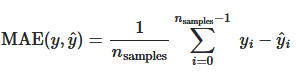


Eine weitere gängige Metrik ist der **Mean-Squared-Error (MSE)** oder zu deutsch die mittlere quadratische Abweichung.  
Dabei wird die Differenz zwischen dem eigentlichen und dem vorhergesagte Wert ermittelt und quadriert. Die Abweichung beschreibt die Qualität der Vorhersage, je kleiner die Abweichung, desto besser die Vorhersage.  
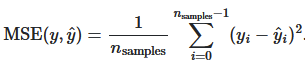

Wie in der folgenden Codezeile zu sehen, sind die Ergebnisse des MAE und MSE erfreulich klein, d.h. das Modell macht einen nur geringe Fehler bezogen auf den Mittelwert.  
>**Ist das Modell als gut zu bewerten?**  
>Es müssen weitere Metriken betrachtet werden!


Quellen:  
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_absolute_error.html




In [28]:
# importiere Mean-Squared-Error Modul
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

print("Mean-Absolute-Error:",mean_absolute_error(y_test,y_prediction))
print("Mean-Squared-Error:",mean_squared_error(y_test,y_prediction))

Mean-Absolute-Error: 0.005323556810979114
Mean-Squared-Error: 6.352208980172284e-05


In [29]:
#importiere max-error und r2_score Modul
from sklearn.metrics import max_error
from sklearn.metrics import r2_score

print("Maximaler Vorhersage-Fehler:",max_error(y_test,y_prediction))
print("R2-Score:",r2_score(y_test,y_prediction))
print("Maximaler Verschleiss: ",  y_test.min())

Maximaler Vorhersage-Fehler: 0.09212935545309588
R2-Score: 0.40675281274692576
Maximaler Verschleiss:  -0.0980224609375


**R2-Score / Max-Error**  

Der maximale Vorhersagefehler / **max Error** liegt bei 0.0921mm, der maximale Verschleiß bei -0,098mm, d.h. das Modell lag bei dieser einzelnen Vorhersage um 100% daneben.  

Der **R2-Score** ist eine Metrik, welche die Varianz (Schwankung) mit Hilfe der unabhängigen Variablen bestimmt.  
Ziel des R2-Scores ist die Bestimmung, wie gut die unabhängigen Variablen die Zielvariable beschreiben.  
Das Ergebnis ist eine Maßzahl zwischen 0 - 1, wobei 1 das bestmögliche Ergebnis repräsentiert.

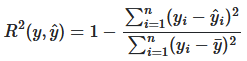

Der maximale Fehler liegt bei fast 100% und der R2-Score bei knappen 41%.  
Ein deutlich schechteres Ergebnis als bei den vorigen Metriken.  

Quelle:  
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.r2_score.html


**Was ist passiert?**  
Um zu interpretieren, warum der R2-Score relativ schlecht ist, werden die Test- und Vorhersagedaten geplottet. 

<AxesSubplot:>

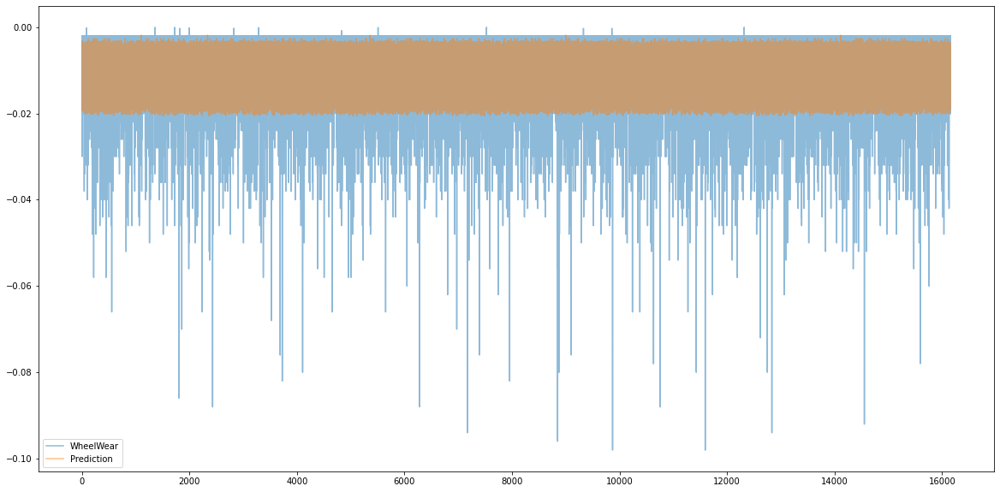

In [30]:
#Erstelle neuen Dataframe mit den Test und Vorhersagedaten, um den Werkzeugverschleiß zu visualisieren
dfLR2=pd.DataFrame(y_test)
dfLR2['Prediction']=y_prediction
dfLR2 = dfLR2.reset_index(drop=True)
dfLR2.plot(y=["WheelWear", "Prediction"],use_index=True, alpha =0.5, figsize=(20,10))

**Fazit** 

Bei dem erzeugten Plot ist zu sehen, dass das Modell underfitted, d.h. der Algorithmus kann aus den vorhandenen Daten keine relevanten Schlüsse ziehen, um später korrekte Vorhersagen über neue Daten treffen zu können.  

Die Vorhersage (orange) bildet den Mittelwert des Werkzeugverschleiß ab, d.h. das Modell hat gelernt den Mittelwert des Verschleiß auszugeben.  

Abschließend wird noch ein Histogramm von Verschleiß und Verschleißprognose ausgegeben. Würde das Modell gut passen, wäre eine ähnliche Häufigkeitsverteilung zu erwarten.

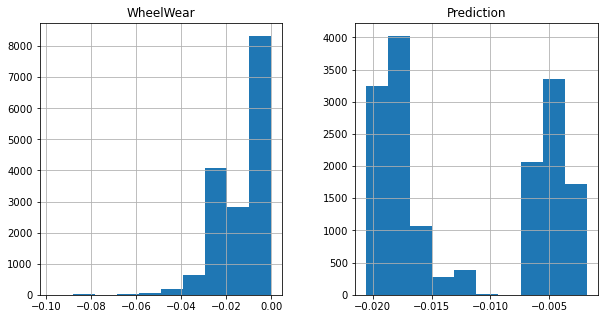

In [31]:
dfLR2.hist(figsize=(10,5))
plt.show()

## 3.4 Random Forest Regressor
Da die Ergebisse des linearen Regressors schwächer ausgefallen sind als erwartet, wird folgend ein Random Forest Regressor auf den Datensatz angewendet.  

Bei diesem Regressionsverfahren werden unkorrelierende Entscheidungsbäume erstellt. Jeder Entscheidungsbaum (Decision Tree) besteht aus mehreren Verzweigungen und trifft anhand von Eingangsdaten eine eigene Entscheidung.  
Aus diesen Einzelentscheidungen wird ein "Wald", also eine Menge an Entscheidungen erstellt, woraus der Algorithmus die entgültige Vorhersage trifft.  
Die zufällige Varianz der Entscheidungsbäume erhöht die Genauigkeit der Vorhersage.

Aufgrund der hohen Anzahl von Datensätzen wird der Random Forest Regressor (RFR) eingesetzt, da er parallel und schnell die Einzelbäume trainieren kann und somit in kurzer Zeit ein Ergebnis liefert.

Wie beim linearen Regressor wird der RFR zuerst mit zufälligen Hyperparametern trainiert und anschließend die gleichen Metriken wie beim linearen Regressor ausgegeben. 

### 3.4.1 Modellerstellung

In [32]:
#Hyperparemeter aus Optimierung mit Gittersuche 
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators = 200, max_features = 'sqrt', max_depth = 10, random_state = 42)
rf.fit(x_train, y_train)

rf_prediction = rf.predict(x_test)

### 3.4.2 Gittersuche zum Optimieren der Hyperparameter
Die Gittersuche ist auskommentiert, um beim Ausführen des Notebooks Ressourcen zu sparen.

```python
import datetime
from sklearn.model_selection import GridSearchCV

## Define Grid 
grid = { 
    'n_estimators': [10,50,100,200],
    'max_features': ['sqrt','log2'],
    'max_depth' : [6,7,8,9,10],
    'random_state' : [42]
}
## show start time
print(datetime.datetime.now())## Grid Search function
CV_rfr = GridSearchCV(estimator=RandomForestRegressor(), param_grid=grid, cv= 5)
CV_rfr.fit(x_train, y_train)## show end time
print(datetime.datetime.now())

#Ausgabe der besten Parameter für den Random Forest
CV_rfr.best_params_
```

### 3.4.3 Evaluation und Vergleich der Metriken

In [33]:
print("                       |Random Forest|       |Linear Regressor|")
print(f"Mean-Absolute-Error: {mean_absolute_error(y_test,rf_prediction)}|{mean_absolute_error(y_test,y_prediction)}")
print(f"Mean-Squared-Error: {mean_squared_error(y_test,rf_prediction)} | {mean_squared_error(y_test,y_prediction)}")
print(f"R2-Score: {r2_score(y_test,rf_prediction)} | {r2_score(y_test,y_prediction)}")
print(f"Maximaler Vorhersage-Fehler: {max_error(y_test,rf_prediction)} | {max_error(y_test,y_prediction)}")

                       |Random Forest|       |Linear Regressor|
Mean-Absolute-Error: 0.0048423291246602095|0.005323556810979114
Mean-Squared-Error: 5.505573603021666e-05 | 6.352208980172284e-05
R2-Score: 0.48582200862686475 | 0.40675281274692576
Maximaler Vorhersage-Fehler: 0.09090633939504009 | 0.09212935545309588


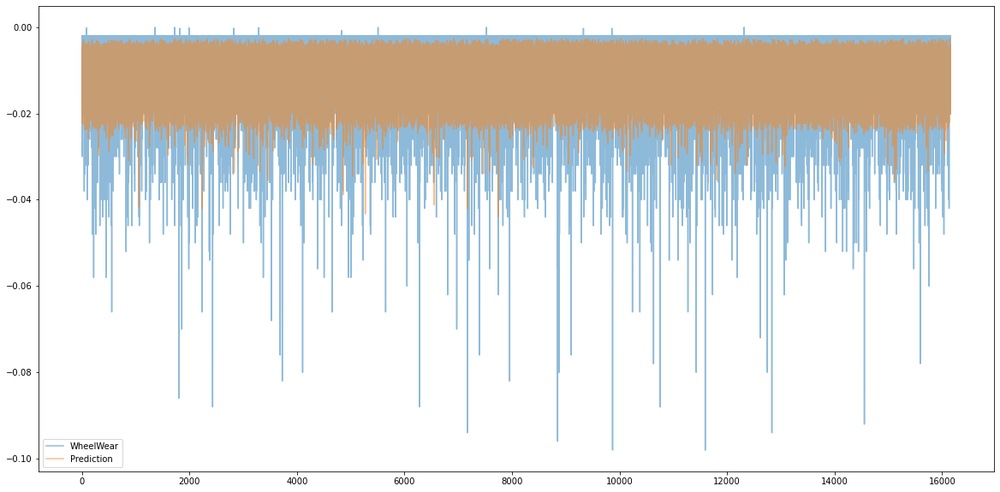

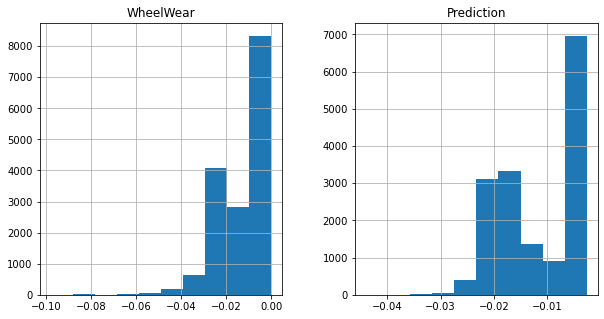

In [34]:
#Erstelle neuen Dataframe mit den Test und Vorhersagedaten, um den Werkzeugverschleiß zu visualisieren
dfRF=pd.DataFrame(y_test)
dfRF['Prediction']=rf_prediction
dfRF = dfRF.reset_index(drop=True)
dfRF.plot(y=["WheelWear", "Prediction"],use_index=True, alpha =0.5, figsize=(20,10))
dfRF.hist(figsize=(10,5))
plt.show()

Mit Verwendung und Optimierung des Random Forest Regressor konnte der R2-Score um 8 Prozentpunkte erhöht werden.  
Der MAE und MSE sind ebenfalls niedriger und die Verteilung des prognostizierten zum tatsächlichen Steinverschleiß sieht ebenfalls ähnlicher aus. 

## 3.5 UI 
Um das Regressor-Modell niederschwellig verwenden zu können, wird eine UI erstellt, um Prozessdaten eingeben zu können und den zu erwartenden Verschleiß zu prognostizieren.  
Bedient wird die Eingabe über interaktive Schieberegler, zum Vorgeben der Prozessgrößen.  
Die Regler haben Grenzwerte, damit nur plausible Werte eingegeben werden können.  

Durch Betätigung der Schaltfläche `predict Wheelwear` wird der zu erwartende Verschleiß berechnet. 

In [35]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual, Layout
import ipywidgets as widgets
import numpy as np

style = {'description_width': 'initial'}
# input widgets that should only change the calcs after hitting the submit function
D_widget = widgets.FloatSlider(min=180.0, max=300.0, step=0.05, description='Steindurchmesser [mm]', 
                               readout=True, value=250, style=style,layout=Layout(width='400px'))
V_widget = widgets.FloatSlider(min=1.0, max=7.0, step=0.01, description='Bandgeschwindigkeit [m/min]', 
                               readout=True, value=5, style=style,layout=Layout(width='400px'))
T_widget = widgets.FloatSlider(min=0.5, max=3.0, step=0.01, description='Banddicke [mm]', 
                               readout=True, value=1.5, style=style,layout=Layout(width='400px'))
A_widget = widgets.FloatSlider(min=2.0, max=30.0, step=0.01, description='Schleifwinkel [°]', 
                               readout=True, value=10, style=style,layout=Layout(width='400px'))
S_widget = widgets.FloatSlider(min=0.1, max=1.0, step=0.01, description='Symmetrie [%]', 
                               readout=True, value=0.5, style=style,layout=Layout(width='400px'))
#Symmetrie: Wieviel Prozent der Banddicke wird geschliffen? 0.5 bedeutet 50% also die Hälfte, 1.0 bedeutet 100% also einseitiger Schliff

D_widget.style.handle_color = '#4BB79B'
V_widget.style.handle_color = '#4BB79B'
T_widget.style.handle_color = '#4BB79B'
A_widget.style.handle_color = '#4BB79B'
S_widget.style.handle_color = '#4BB79B'
# recalculate function
def predict(Dia, Velo, Thick, Angle, Sym):
    #calculate cutting surface
    vCut=0.5*Thick*Sym*(Thick/np.tan(np.radians(Angle)))
    
    #create array for prediction
    Userdata=np.array([[Dia,Velo,vCut]])
    
    #predict Wheelwear
    prediction=LR.predict(Userdata)
    
    if prediction>0:
        print("Unplausible Eingabe")
        return
    
    print("###########################################")
    print(f"Zerspanfäche:  {format(vCut,'.4f')} [mm²]")
    print(f"erwarteter Steinverschleiß: {format(float(prediction),'.4f')} [mm]")
    print("###########################################")
    return
    # code to perform some calcs on a dataframe based on the widget inputs and print the result

#Set label of interact button
widgets.interact_manual.opts['manual_name'] = 'Predict Wheelwear'

# code that ties the input calculations to the calculations
out = widgets.interact_manual(predict, Dia= D_widget, Velo= V_widget, Thick=T_widget, Angle=A_widget, Sym=S_widget)

interactive(children=(FloatSlider(value=250.0, description='Steindurchmesser [mm]', layout=Layout(width='400px…

# 4. Zusammenfassung
Zur Durchführung des Projekts wurde eine prozesstechnische Problemstellung formuliert und geeignete Daten ausgewählt, die über mehrere Wochen in zwei Produktionsanlagen erfasst und in einer installierten Datenbank gespeichert wurden.  
Das Auslesen und Vorbereiten der Daten waren notwendige Schritte, um homogene Datensätze für die Anwendung von Machine-Learning Algorithmen zu erzeugen.  
Aus den erstellten Datensätze wurde ein Dataframe-Objekt erzeugt, welches mit Methoden der deskriptiven Statistik untersucht wurde, um Korrelation und Verteilungen erkennen und interpretieren zu können.  
Es wurde ein knn-Klassifikator und ein linearer Regressor auf den Datensatz angewendet, um durch Eingabe von neuen Prozessdaten eine Vorhersage zum Verschleiß zu erhalten. Hierfür wurden die Daten skaliert und in Test- und Trainingsdaten aufgeteilt.  
Mit Gittersuche wurde eine Optimierung der Hyperparameter des knn-Klassifikators durchgeführt. 
Die Modelle wurden mit verschiedenen Metriken bewertet, um die Vorhersagequalität zu beurteilen. 

Abschließend wurde eine UI mit Jupyter Widgets erstellt, um mit interaktiven Kontrollelementen Prozessdaten einzugeben und diese durch das Regressionsmodell bewerten zu lassen.  
Da die Qualität des Regressors nicht zufreidenstellend war, wurde ein Random Forest Regressor auf den gleichen Datensatz implementiert, um die beiden Algorithmen zu vergleichen.

Das Ziel ein Proof-of-Concept für die Anwendung von ML bei einer prozesstechnischen Fragestellung ist erreicht und eine niederschwellige Schnittstelle (UI) zur Bedienung des Modells wurde erstellt.  

Während der Implementierung wurde die Datenqualität ein immer größeres Thema.  
Die Korrelationsmatrix erzielte bereits deutlich schlechtere Ergebnisse als erwartet wurden. Den vorab ausgewählten Prozessgrößen wurde eine hohe Korrelation zugeschrieben.  
Das Ergebnis des Klassifikators mit 85% Trefferwahrscheinlichkeit und die nur 40% bzw. 48% Vorhersagewahrscheinlichkeit der Regressoren waren im ersten Moment Rückschläge.  
Die Modelle sind als unpräzise zu bewerten.
Da nur über einge Wochen und nur bei zwei Anlagen Prozessdaten aufgenommen wurden, ist die Varianz in den Daten gering. Evtl. ist die Menge an Datenpunkten zu groß, da sekündlich eine Abtastung stattgefunden hat.  
Diese Mängel in den Daten sorgen dafür, dass die Algorithmen kein gültiges Wissen ableiten können. 

Positiv ist, dass verschiedene Werkzeuge, wie z.B. Metriken und Visualisierungen eingesetzt wurden, um die Qualität der Modelle und Daten zu beurteilen.  
Durch Eingabe neuer Daten kann eine positive oder auch negative Änderung kurzfristig festgestellt werden.

## 4.1 Ausblick

Um das Projekt weiter zu entwickeln sind während der Bearbeitung bereits Ideen entstanden.  
Der wohl wichtigste Punkt ist eine passendere Datengrundlage zu schaffen, bei welcher die Prozesswerte besser mit der Zielgröße korrelieren. 
Die Datensätze benötigen für präzise Vorhersagen mehr Varianz, d.h. verschiedene Bandgeschwindigkeiten, Schleifwinkel, Materialstärken und ggfs. Temperaturen (Maschinenbett, Kühlmittel).

Wenn die Daten persistiert werden, wäre eine automatisierte Pipeline wünschenswert, die intervall- oder ereignisgesteuert die Vorhersagemodelle neu berechnet und bewertet.  

Wenn das Vorhersagemodell an Qualität gewinnt und das Modell automatisiert neue Daten verarbeitet, ist ein Parallelbetrieb zum Kameraregelkreis denkbar.  
Im aktuellen Zustand kann das ML-Modell die herkömmliche Regelungstechnik nicht ersetzen.


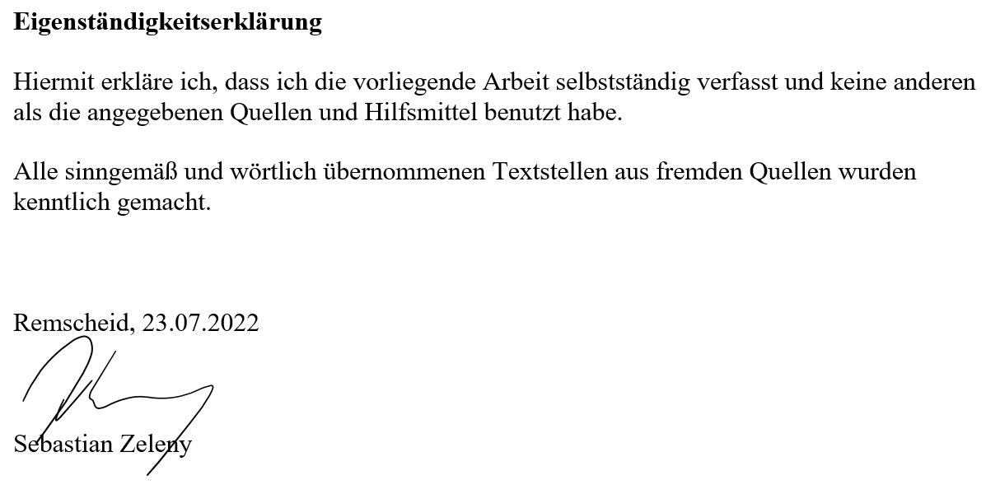